# Data Import

In [1]:
import os
import sys

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas

script_dir = os.path.abspath("")
mymodule_dir = os.path.join(script_dir, "..", "scripts")
sys.path.append(mymodule_dir)
import cleaning

pd.set_option("mode.copy_on_write", True)
sns.set_theme()
sns.set_style("white")
%config InlineBackend.figure_format = "retina"

jobs_df = cleaning.prep(pd.read_pickle("../data/jobs.pkl"), filtered=False, categories_reduced=False)
# display(jobs_df.columns)

In [2]:
jobs_df.head()

,Titel,Unternehmen,Ort,Gehalt_min,Gehalt_max,JobID,Link,Datum,Teilzeit_Remote,Introduction,...,Contact,Vollzeit,Teilzeit,Zeit flexibel,Remote,Job Kategorie,Junior,Gehalt_min_yearly,Gehalt_max_yearly,Gehalt_durchschnitt_yearly
0,(Junior) Data Scientist (m/w/d),KMH GmbH,Köln,4032,5726,57650956,https://www.stepstone.de/stellenangebote--juni...,2023-09-04,"Vollzeit, Teilzeit, Home Office möglich",Wir suchen in Voll- oder Teilzeit\nWir suchen ...,...,Wir freuen uns über deine Bewerbung!\n\n KMH G...,True,True,True,True,Data Scientist,True,48384,68712,58548.0
1,Junior Data Scientist (m/w/d),TUI Cruises GmbH,Hamburg,3548,5081,57605321,https://www.stepstone.de/stellenangebote--juni...,2023-09-04,"Vollzeit, Home Office möglich",TUI Cruises ist einer der führenden Kreuzfahrt...,...,TUI Cruises GmbH \nHeidenkampsweg 58\n20097 Ha...,True,False,False,True,Data Scientist,True,42576,60972,51774.0
2,Junior Data Scientist (m/f/x),TUI Cruises GmbH,Hamburg,3548,5081,57605323,https://www.stepstone.de/stellenangebote--juni...,2023-09-04,"Vollzeit, Home Office möglich",TUI Cruises is one of the leading cruise provi...,...,TUI Cruises GmbH \nHeidenkampsweg 58\n20097 Ha...,True,False,False,True,Data Scientist,True,42576,60972,51774.0
3,(Junior) Data Scientist / Data Analyst (w/m/d),1&1,"Karlsruhe, Montabaur, Maintal",3871,6129,57608864,https://www.stepstone.de/stellenangebote--juni...,2023-09-04,"Vollzeit, Home Office möglich",Mit rund 15 Mio. Kundenverträgen und 3.200 Mit...,...,,True,False,False,True,Data Scientist,True,46452,73548,60000.0
4,Junior Data Scientist (m/w/d) – Risikomodelle,Sparkassen Rating und Risikosysteme GmbH,Berlin,3710,5161,57181289,https://www.stepstone.de/stellenangebote--juni...,2023-09-04,"Vollzeit, Home Office möglich",Die Sparkassen Rating und Risikosysteme (SR) i...,...,Herr Emanuel Reitzenstein Tel. +49 30 20672-0 ...,True,False,False,True,Data Scientist,True,44520,61932,53226.0


# Data Cleaning

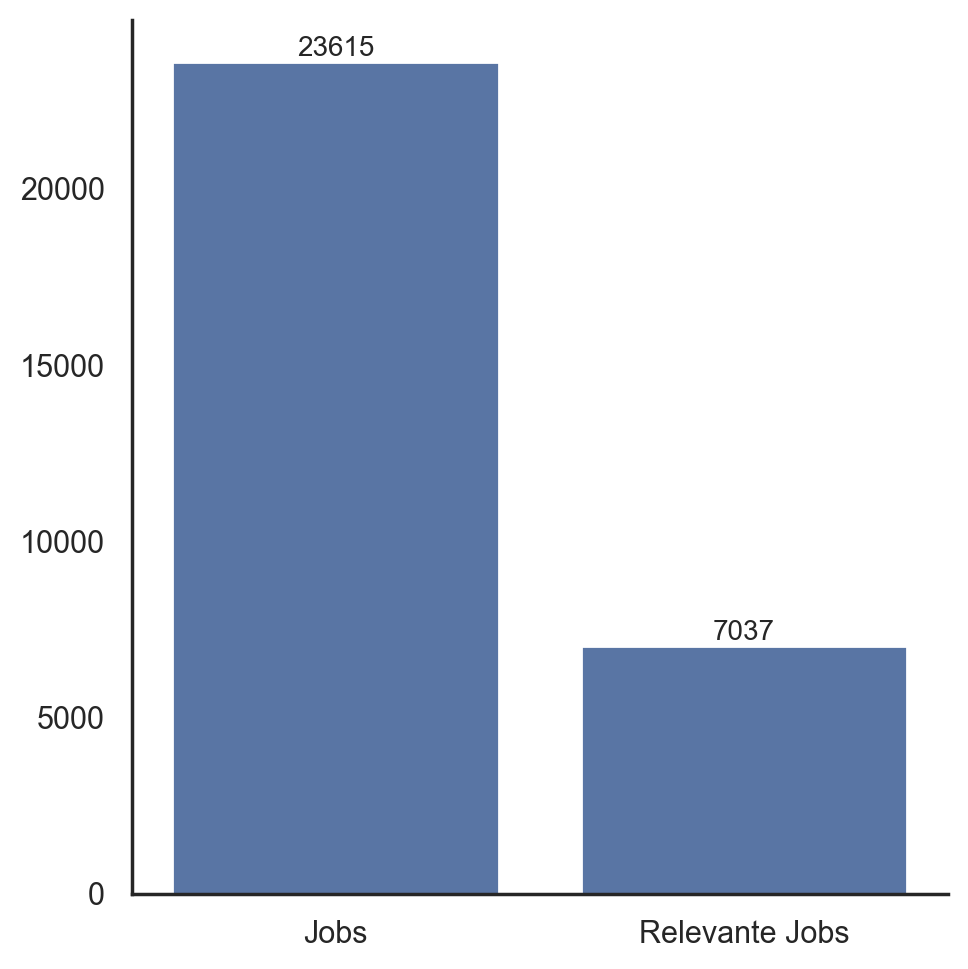

In [3]:
jobs_relevant = cleaning.filter(jobs_df)

g = sns.catplot(data=[len(jobs_df), len(jobs_relevant)], kind="bar")
g.set_xticklabels(["Jobs", "Relevante Jobs"])
ax = g.facet_axis(0, 0)
ax.bar_label(ax.containers[0], fontsize=10)
plt.show()

# EDA

## Job Kategorien

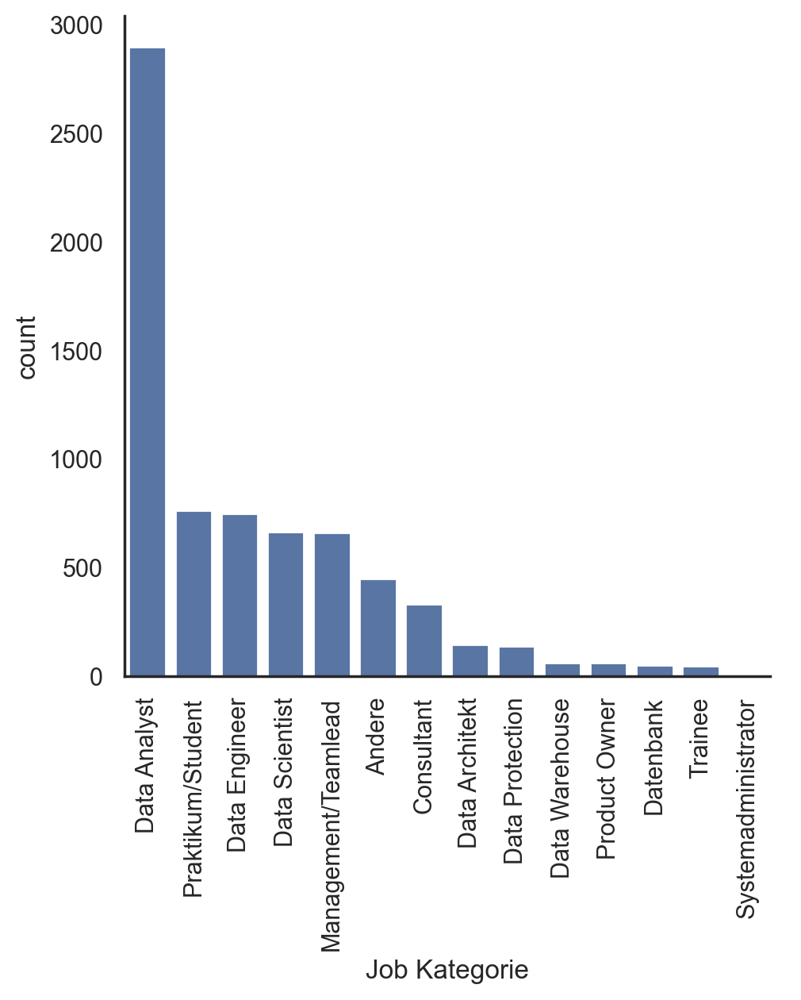

In [4]:
g = sns.catplot(
    data=jobs_relevant,
    x="Job Kategorie",
    kind="count",
    order=jobs_relevant["Job Kategorie"].value_counts().index,
)
plt.xticks(rotation=90)

h = sns.catplot
plt.show()

In [5]:
jobs_scientist_analyst = cleaning.roles(jobs_relevant)

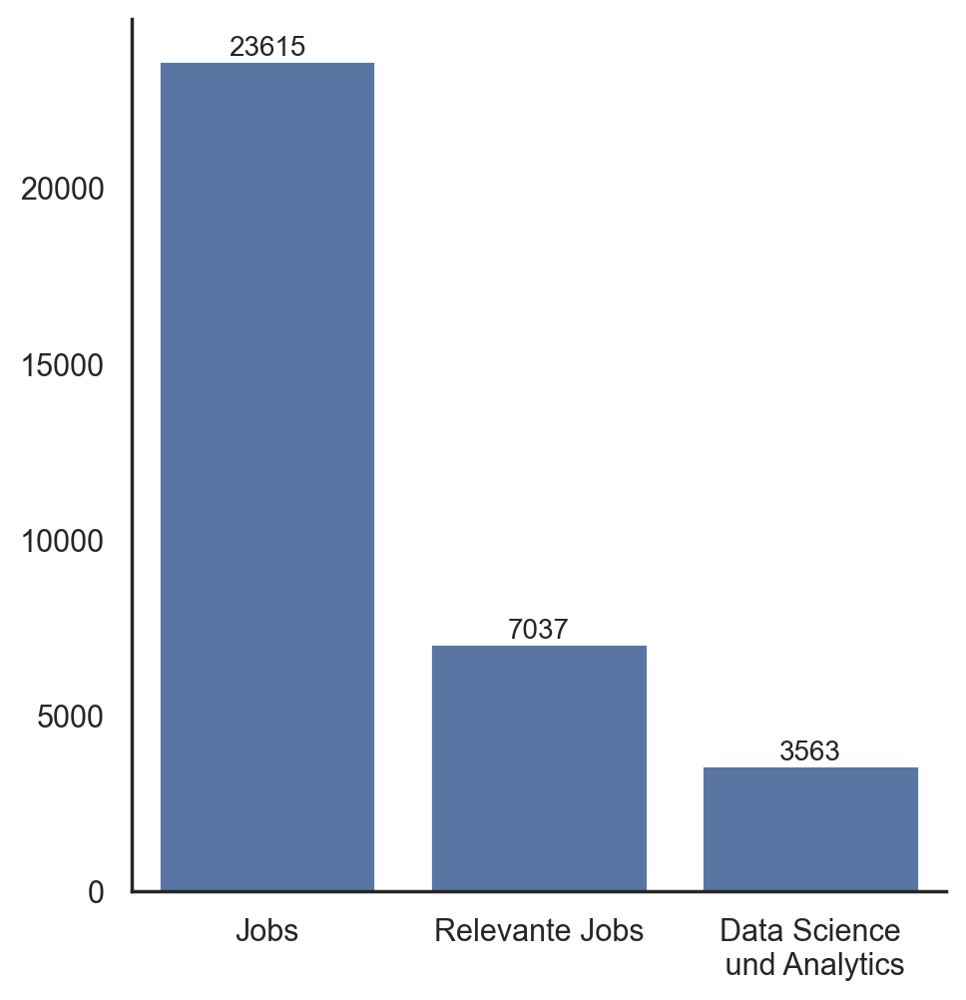

In [6]:
g = sns.catplot(
    data=[
        len(jobs_df),
        len(jobs_relevant),
        len(jobs_scientist_analyst),
    ],
    kind="bar",
)
g.set_xticklabels(
    ["Jobs", "Relevante Jobs", "Data Science\n und Analytics"]
)
ax = g.facet_axis(0, 0)
ax.bar_label(ax.containers[0], fontsize=10)
plt.show()

## Junior Role

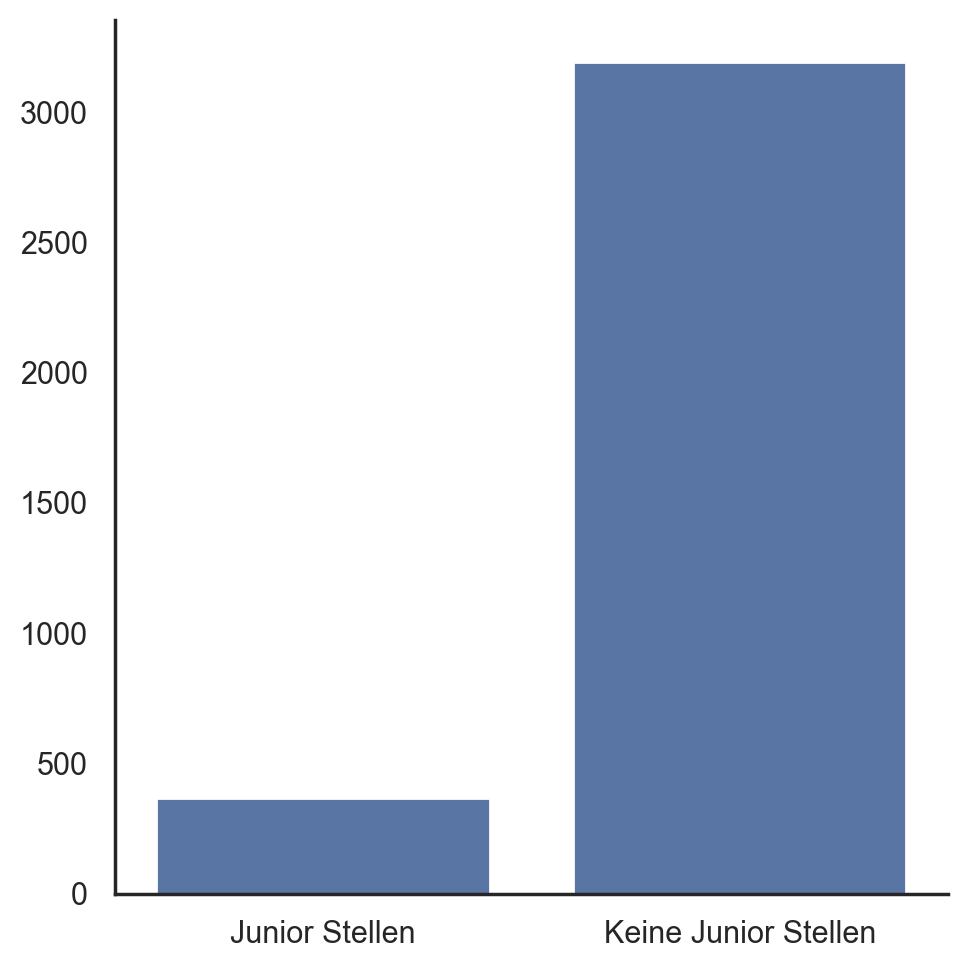

368 Junior Stellen, 3195 Andere


In [7]:
g = sns.catplot(
    data=[
        len(jobs_scientist_analyst[jobs_scientist_analyst["Junior"]]),
        len(jobs_scientist_analyst[~jobs_scientist_analyst["Junior"]]),
    ],
    kind="bar",
)
g.set_xticklabels(["Junior Stellen", "Keine Junior Stellen"])
plt.show()

print(
    "{} Junior Stellen, {} Andere".format(
        len(jobs_scientist_analyst[jobs_scientist_analyst["Junior"] == True]),  # noqa: E712
        len(jobs_scientist_analyst[~jobs_scientist_analyst["Junior"]]),
    )
)

## Teilzeit, Vollzeit, Flexibel

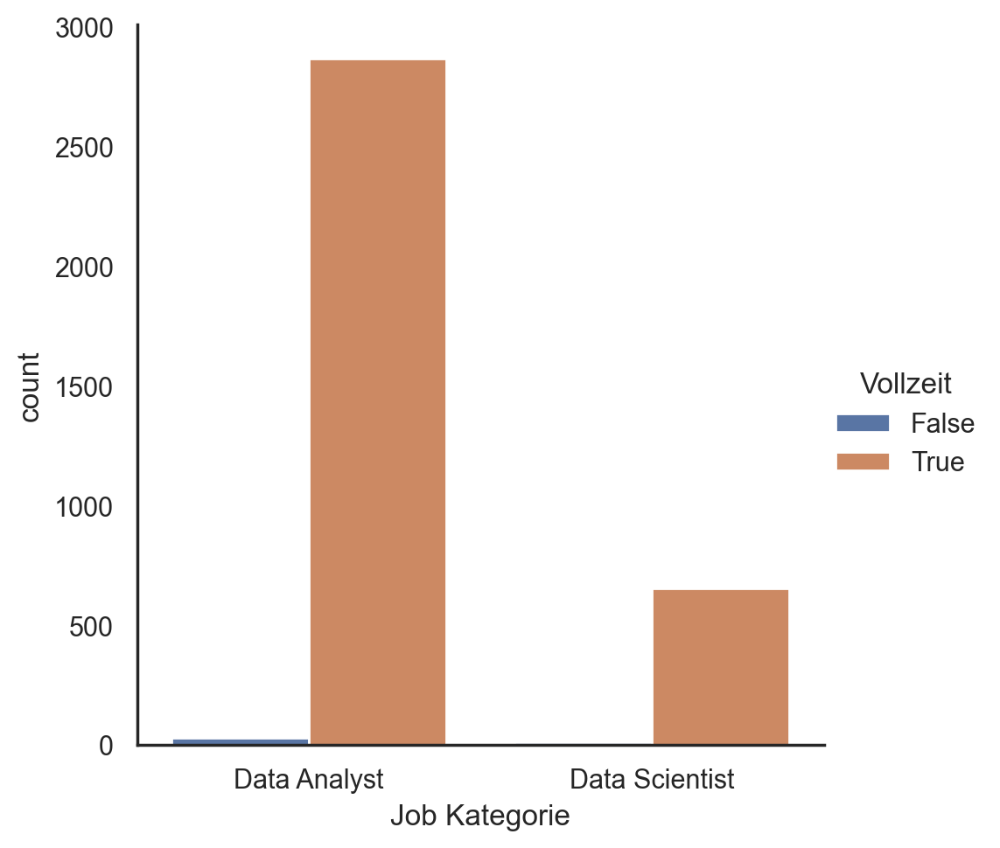

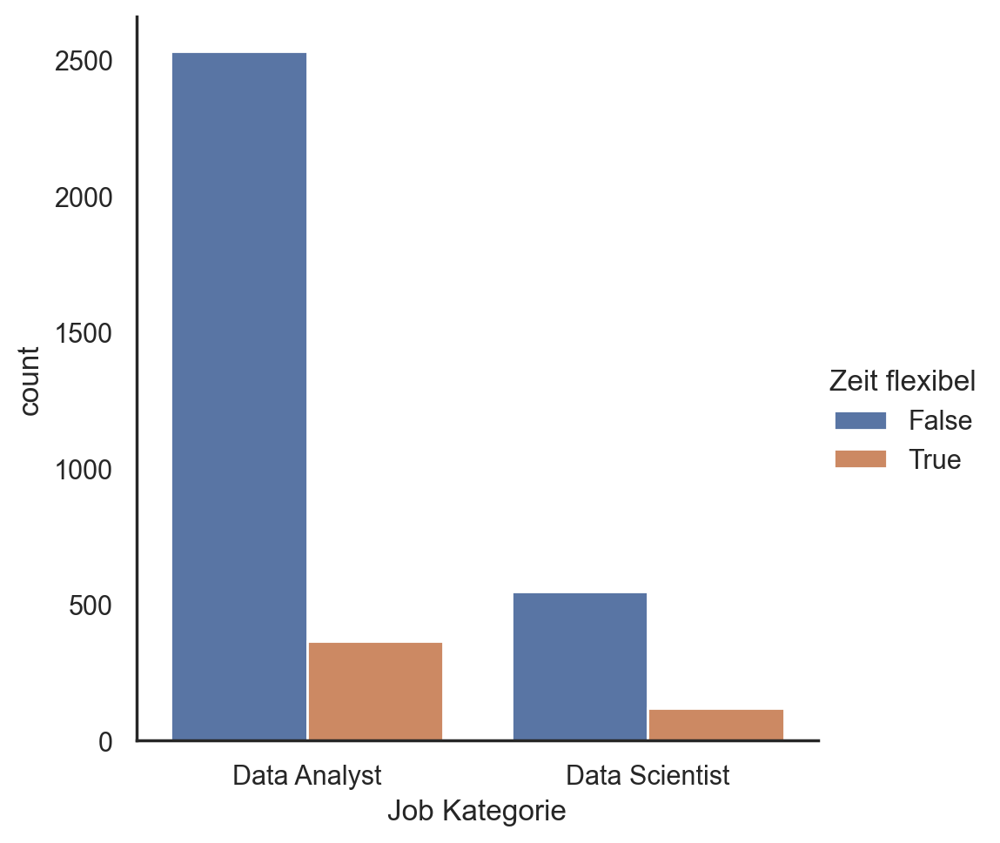

In [8]:
g = sns.catplot(
    data=jobs_scientist_analyst,
    x="Job Kategorie",
    order=["Data Analyst", "Data Scientist"],
    kind="count",
    hue="Vollzeit",
)
h = sns.catplot(
    data=jobs_scientist_analyst,
    x="Job Kategorie",
    order=["Data Analyst", "Data Scientist"],
    kind="count",
    hue="Zeit flexibel",
)

plt.show()

## Ort

In [9]:
# Cleaning
ersetzungen_orte = {
    ", de, \\d*": "",
    "alle standorte, ": "",
    "\\(.+?\)": "",
    " bei [^,]+": "",
    "\\d+": "",
    "\(|\)": "",
    "\\u200b": "",
    ", germany": "",
    "bundesweit( im)?": "",
    " am rhein": "",
    " am bodensee": "",
    "/ heidelberg": "",
    "Region": "",
    "D\-PLZ": "",
    "EMEA": "",
    "Donnerschweer Str.": "",
    "Potsdamer Platz": "",
    "Ingelheim": "Ingelheim am Rhein",
    "frankfurt/main|frankfurt a\.m\.|frankfurt a\. m\.": "Frankfurt am Main",
    "oberkochenoberkochen": "Oberkochen",
    "garching": "Garching b. München",
    "windach raum münchen": "Windach",
    "\\bberlin\\b": "Berlin",
    "Röthenbach a. d. Pegnitz / Metropol Nürnberg": "Röthenbach an der Pegnitz",
    "Luxembourg": "Luxemburg",
    "Heppenheim": "Heppenheim (Bergstraße)",
    "Sankt Katharinen": "Sankt Katharinen (Landkreis Neuwied)",
    "Ludwigshafen": "Ludwigshafen am Rhein",
    "Freiburg(?! )": "Freiburg im Breisgau",
    "Landsberg am Lech": "Landsberg a. Lech",
    "Bad Homburg(?! )|Bad Homburg vor der Höhe|Bad Homburg v. d. Höhe": "Bad Homburg v.d. Höhe",
    "Kempten": "Kempten (Allgäu)",
    "Flörsheim": "Flörsheim am Main",
    "Stuttgart - Fellbach": "Fellbach",
    "Home-Office|bundesweit|home office|homeoffice|fernbedienung|remote|Deutschlandweit": "",
    "Ottobrunn": "Ottobrunn/Riemerling",
    "München-Nord": "München",
    "Oberursel": "Oberursel (Taunus)",
    "Pullach": "Pullach i. Isartal",
    "Kästorf": "Gifhorn",
    "Aretsried": "Fischach",
    "Boppard-Buchholz": "Boppard",
    "Eschborn / Frankfurt": "Eschborn",
    "Abersloh": "Sendenhorst",
    "(Kirchdorf/)?Oberopfingen": "Kirchdorf an der Iller",
    "Lindau": "Lindau (Bodensee)",
    "Bergisch-Gladbach": "Bergisch Gladbach",
    "St. Leon-Rot": "Sankt Leon-Rot",
    "Spich": "Troisdorf",
    "Karlstadt-Stetten": "Stetten",
    "Fürstenwalde/Spree": "Fürstenwalde/ Spree",
    "Hauptverwaltung Düsseldorf": "Düsseldorf",
    "Bad Staffelstein": "Staffelstein",
    "Sonneborn": "Gotha",
    "Borken-Burlo": "Borken",
    "Gummersbach / Siegen": "Gummersbach,Siegen",
    "Mattighofen|Grevenmacher|Flawil|Obernai|Thayngen|Palma de Mallorca|Zürich|Paris|Salzburg|Innsbruck|Wien|Luxemburg|Schwabenheim an der Selz": "\g<0> (Ausland)",
}

staedte_list = jobs_scientist_analyst["Ort"]

for pattern, ersatz in ersetzungen_orte.items():
    staedte_list = staedte_list.str.replace(pattern, ersatz, regex=True, case=False)

# Einzelne Städte
multiple_staedte = staedte_list.str.contains(",| or | oder | und ", regex=True)
einzelne_staedte = staedte_list[~multiple_staedte]
multiple_staedte = staedte_list[multiple_staedte]

In [10]:
multiple_staedte = multiple_staedte.replace(r" or | oder | und ", ",", regex=True)
neue_staedte = []


def teilen(staedte):
    for stadt in staedte.split(","):
        neue_staedte.append(stadt)


multiple_staedte.apply(teilen)

staedte_cleaned = pd.concat(
    [einzelne_staedte, pd.Series(neue_staedte)], ignore_index=True
).str.strip()

staedte_cleaned.replace(r"\n", "", regex=True, inplace=True)
staedte_cleaned = staedte_cleaned[staedte_cleaned != ""]
staedte_cleaned.replace("Künzelsau", "Künzelsau, Ingelfingen", inplace=True)
staedte_cleaned.replace("Pirna", "Pirna, Struppen, Dohma", inplace=True)
staedte_cleaned.replace("Einbeck", "Einbeck, Kreiensen", inplace=True)
staedte_cleaned.replace(
    "Schwaig", "Schwaig b. Nürnberg, Behringersdorfer Forst", inplace=True
)
staedte_cleaned.replace("Bad Hersfeld", "Bad Hersfeld, Ludwigsau", inplace=True)

# staedte_cleaned

In [11]:
df_staedte = pd.DataFrame(data=staedte_cleaned.value_counts()).reset_index()
df_staedte.rename(columns={"index": "Stadt", "count": "Anzahl"}, inplace=True)
# df_staedte.head(20)

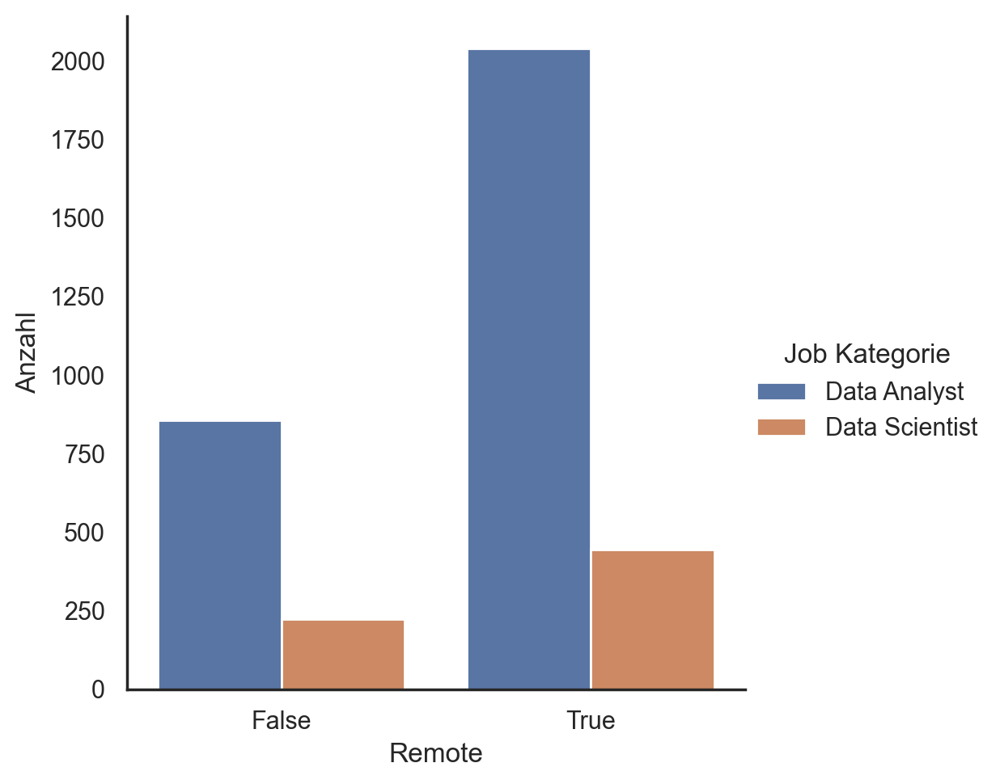

In [12]:
g = sns.catplot(
    data=jobs_scientist_analyst, x="Remote", kind="count", hue="Job Kategorie"
)
plt.ylabel("Anzahl")
plt.show()

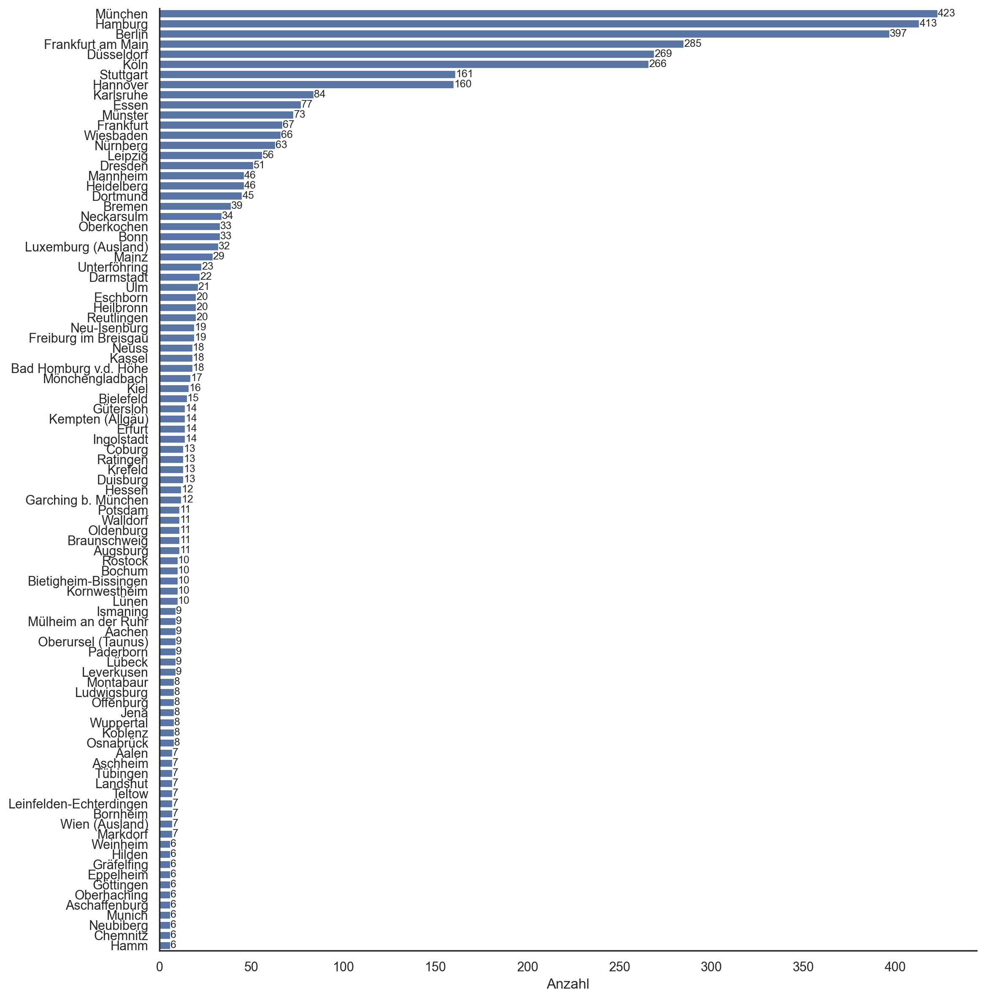

In [13]:
g = sns.catplot(
    data=df_staedte[df_staedte["Anzahl"] > 5],
    y="Stadt",
    x="Anzahl",
    kind="bar",
    height=12,
	dodge="auto",
)
ax = g.facet_axis(0, 0)
ax.bar_label(ax.containers[0], fontsize=9)
g.set(ylabel="")
plt.show()

In [14]:
gdf = geopandas.read_file("../data/geo_raw/krs/krs.shp")
gdf["krs_code"] = gdf.krs_code.astype("int")

kreise = pd.read_csv("../data/geo_raw/georef-germany-postleitzahl.csv", delimiter=";")
kreise = kreise[["PLZ Name (short)", "Kreis code"]]
kreise.rename(
    {"PLZ Name (short)": "Stadt", "Kreis code": "krs_code"}, axis=1, inplace=True
)
kreise.drop_duplicates(subset="Stadt", inplace=True)

geo_kreise = kreise.merge(gdf, how="left", on="krs_code")

umlaute = {"Ã¤": "ä", "Ã¼": "ü", "Ã¶": "ö", "Ã\x9f": "ß"}
for key, value in umlaute.items():
    geo_kreise["krs_name"] = geo_kreise["krs_name"].str.replace(key, value)

# geo_kreise

In [15]:
jobs_with_geo = df_staedte.merge(geo_kreise, on="Stadt", how="left")
jobs_with_geo.dropna(subset=["geometry"], inplace=True)
geo_jobs = geopandas.GeoDataFrame(jobs_with_geo)

In [16]:
# Non matches

# geo_na = jobs_with_geo.loc[jobs_with_geo["geometry"].isna(), ["Stadt"]]

# for stadt in geo_na["Stadt"]:
# 	print(stadt)
# 	display(geo_kreise.loc[geo_kreise["Stadt"].str.contains(stadt), ["Stadt"]])
# 	display(geo_kreise.loc[geo_kreise["krs_name"].str.contains(stadt), ["krs_name"]])

In [17]:
# stadt = "Borken"
# display(geo_kreise.loc[geo_kreise["Stadt"].str.contains(stadt), ["Stadt"]])
# display(geo_kreise.loc[geo_kreise["krs_name"].str.contains(stadt), ["krs_name"]])

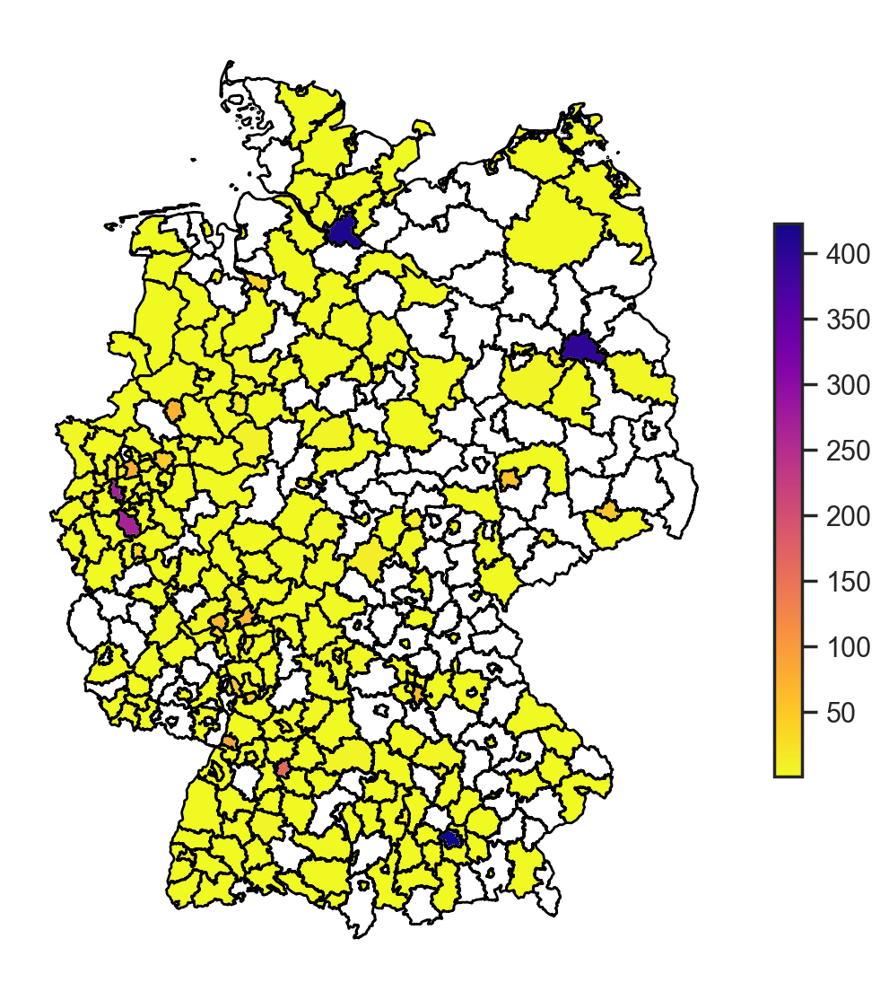

In [18]:
fig, ax = plt.subplots()
fig.set_figheight(8)
gdf.boundary.plot(linewidth=1, ax=ax, color="Black")
geo_jobs.plot(
    column="Anzahl", legend=True, legend_kwds={"shrink": 0.5}, ax=ax, cmap="plasma_r"
)
plt.axis("off")
plt.show()

In [19]:
geo_jobs.explore("Anzahl", cmap="plasma_r")

In [22]:
jobs_scientist_analyst.columns

Index(['Titel', 'Unternehmen', 'Ort', 'Gehalt_min', 'Gehalt_max', 'JobID',
       'Link', 'Datum', 'Teilzeit_Remote', 'Introduction', 'Description',
       'Profile', 'We_offer', 'Contact', 'Vollzeit', 'Teilzeit',
       'Zeit flexibel', 'Remote', 'Job Kategorie', 'Junior',
       'Gehalt_min_yearly', 'Gehalt_max_yearly', 'Gehalt_durchschnitt_yearly'],
      dtype='object')

In [23]:
sample_descriptions = jobs_scientist_analyst.Profile.sample(10)

In [21]:
sample_descriptions

13141    Gestaltung, Umsetzung und Weiter­entwicklung v...
24873                                                     
22909                                                     
25291                                                     
41       Verantwortung für Gremien- oder Kunden­projekt...
6787      Bilden Sie die Schnittstelle zwischen dem Fac...
20556                                                     
13065    Innerhalb von AFCs GP konzentriert sich die „I...
16718    Sie arbeiten in einem agilen Team und in agile...
6636     Eigenständige Beurteilung und Bewertung komple...
Name: Description, dtype: object